In [1]:
import pandas as pd
from sklearn.datasets import load_boston

# graph visualization
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import io

# Tree visualization
# https://medium.com/@rnbrown/creating-and-visualizing-decision-trees-with-python-f8e8fa394176

total_data = load_boston()
print(dir(total_data))

['DESCR', 'data', 'feature_names', 'filename', 'target']


In [2]:
print(total_data.DESCR)

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

In [3]:
print(total_data.feature_names)
print("X:",total_data.data.shape)
print()

['CRIM' 'ZN' 'INDUS' 'CHAS' 'NOX' 'RM' 'AGE' 'DIS' 'RAD' 'TAX' 'PTRATIO'
 'B' 'LSTAT']
X: (506, 13)



In [4]:
X = pd.DataFrame(total_data.data,columns=total_data.feature_names)
y = pd.DataFrame(total_data.target)

X.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


# Pandas Profiling 설치

그냥하면 버젼이 안맞는지 오류가 많으므로 아래의 명령어로 설치  
pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

- CRIM:     per capita crime rate by town
- ZN :      proportion of residential land zoned for lots over 25,000 sq.ft.
- INDUS  :  proportion of non-retail business acres per town
- CHAS  :   Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
- NOX   :   nitric oxides concentration (parts per 10 million)
- RM   :    average number of rooms per dwelling
- AGE  :    proportion of owner-occupied units built prior to 1940
- DIS :     weighted distances to five Boston employment centres
- RAD   :   index of accessibility to radial highways
- TAX   :   full-value property-tax rate per USD 10,000
- PTRATIO : pupil-teacher ratio by town
- B      :  1000*(Bk - 0.63)^2 where Bk is the proportion of blacks by town  
- LSTAT  :  % lower status of the population
- MEDV    : Median value of owner-occupied homes in $1000's

In [5]:
from pandas_profiling import ProfileReport 

profile = ProfileReport(X)

In [6]:
#profile.to_notebook_iframe()

In [7]:
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.model_selection import train_test_split

# 필요한 모델들을 불러옵니다.
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor

In [8]:
X_train, X_test, y_train, y_test = train_test_split(X.to_numpy(), y.to_numpy(), test_size=0.3, random_state=42)

In [9]:
# Basic Decision Tree
clf = DecisionTreeRegressor()
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print(mean_squared_error(y_test, y_pred))
print(r2_score(y_test, y_pred))

12.08171052631579
0.8378578901568827


In [10]:
dot_data = io.StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=total_data.feature_names)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [11]:
clf = RandomForestRegressor(n_estimators=100, max_features="auto",random_state=0)
clf.fit(X_train, y_train)


y_pred = clf.predict(X_test)

print(mean_squared_error(y_test, y_pred))
print(r2_score(y_test, y_pred))

C:\Users\multicampus\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


9.390483434210527
0.8739753950276081


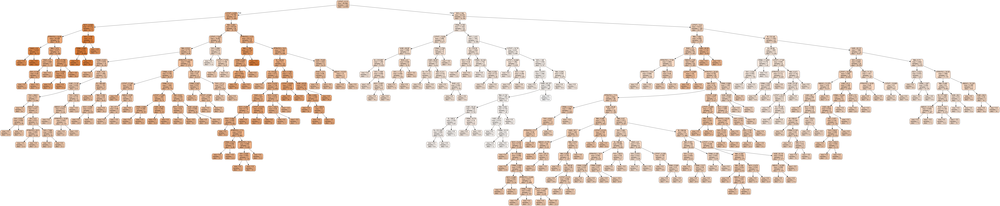

In [12]:
dot_data = io.StringIO()
export_graphviz(clf.estimators_[0], out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=total_data.feature_names)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [13]:
clf = AdaBoostRegressor(n_estimators=100)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print(mean_squared_error(y_test, y_pred))
print(r2_score(y_test, y_pred))

C:\Users\multicampus\Anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


14.98098086051523
0.7989483493291397


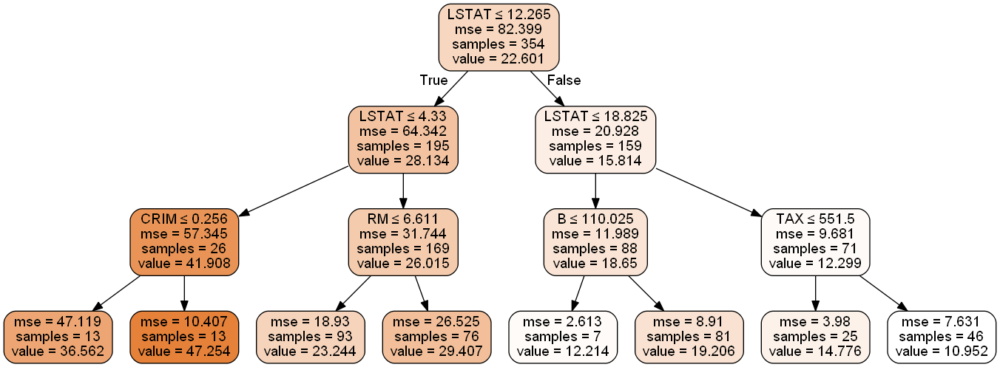

In [14]:
dot_data = io.StringIO()
export_graphviz(clf.estimators_[0], out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=total_data.feature_names)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [15]:
clf = GradientBoostingRegressor(n_estimators=100)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print(mean_squared_error(y_test, y_pred))
print(r2_score(y_test, y_pred))

(100, 1)
7.769165145110308
0.8957342318702342


C:\Users\multicampus\Anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


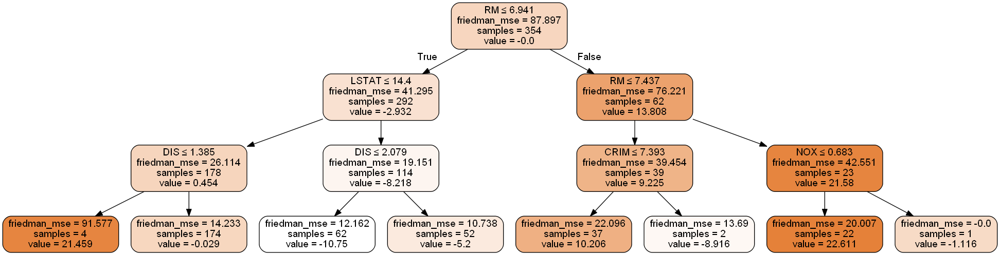

In [16]:
dot_data = io.StringIO()
export_graphviz(clf.estimators_[0,0], out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=total_data.feature_names)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [17]:
import xgboost as xgb

# 파라미터 튜팅이 좀 필요할듯한데 hyperparameter optimization 좀 알아봐야할듯
param = {'max_depth':5, 'eta':0.5, 'objective':'reg:squarederror'}
num_round = 50

train_data = xgb.DMatrix(data=X_train, label=y_train)
test_data = xgb.DMatrix(data=X_test, label=y_test)

tree = xgb.train(param, train_data, num_round)

# make prediction
y_preds = tree.predict(test_data)

print(mean_squared_error(y_test, y_pred))
print(r2_score(y_test, y_pred))

7.769165145110308
0.8957342318702342


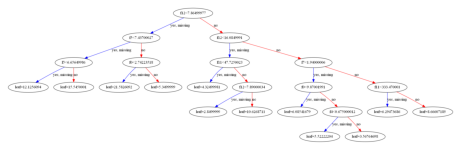

In [18]:
# https://machinelearningmastery.com/visualize-gradient-boosting-decision-trees-xgboost-python/
from xgboost import plot_tree
import matplotlib.pyplot as plt

plot_tree(tree)
plt.show()

In [19]:
# fmap for xgboost
# https://stackoverflow.com/questions/60186747/how-do-i-include-feature-names-in-the-plot-tree-function-from-the-xgboost-librar

print(total_data.feature_names)

with open("./fmap.txt","w") as file:
    for idx,i in enumerate(total_data.feature_names):
        file.write(str(idx)+"\t"+i+"\tq\n")

['CRIM' 'ZN' 'INDUS' 'CHAS' 'NOX' 'RM' 'AGE' 'DIS' 'RAD' 'TAX' 'PTRATIO'
 'B' 'LSTAT']


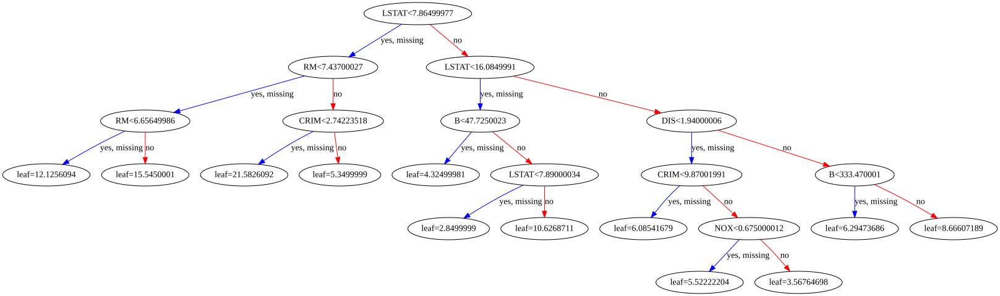

In [20]:
xgb.to_graphviz(tree,fmap="./fmap.txt")